# Analysis of benchmark times

In this notebook, we'll load some data about DaCapo benchmarks. The data contains running times for different "variants" of the benchmarks, and information about the context in which the benchmark is run (machine, startup / steady state, etc). We'll analyse this data to see if context influences the effect of the changes we've made to variants.

In [1]:
benchmark = "bloat"

"bloat"

In [2]:
using CSV, DataFrames, Plots, StatsPlots

In [3]:
data = CSV.read("data/$benchmark-data-multimachine.csv", DataFrame);

In [4]:
names(data)

20-element Vector{String}:
 "Column1"
 "warmup"
 "running-time"
 "jvm-invocation"
 "benchmark"
 "variant"
 "java-version"
 "cpu-model"
 "kernel-release"
 "hostname"
 "kernel-version"
 "cache-properties"
 "converged"
 "run-number"
 "modified_sites_id"
 "label"
 "variant-type"
 "original"
 "first-run"
 "status"

In [5]:
unique(data[!, "java-version"])

2-element Vector{String31}:
 "openjdk version \"1.8.0_292\""
 "8.0.292-open"

In [6]:
selected_columns = ["status", "hostname", "running-time",
    "converged", "first-run", "variant-type",
    "jvm-invocation", "benchmark", "label"] |> x -> map(Symbol, x)

9-element Vector{Symbol}:
 :status
 :hostname
 Symbol("running-time")
 :converged
 Symbol("first-run")
 Symbol("variant-type")
 Symbol("jvm-invocation")
 :benchmark
 :label

In [7]:
data = data[!, selected_columns]

,status,hostname,running-time,converged,first-run,variant-type,jvm-invocation
,String15,String15,Int64,Bool,Bool,String15,Int64
1,Startup,exjobb7,2225,0,1,best,0
2,Warmup,exjobb7,1564,0,0,best,0
3,Warmup,exjobb7,1157,0,0,best,0
4,Warmup,exjobb7,1122,0,0,best,0
5,Warmup,exjobb7,1138,0,0,best,0
6,Steady-state,exjobb7,1114,1,0,best,0
7,Startup,exjobb7,2241,0,1,best,1
8,Warmup,exjobb7,1600,0,0,best,1
9,Warmup,exjobb7,1418,0,0,best,1


In [8]:
# We rename the levels of the variables
machine_rename = Dict("exjobb7" => "hades", "sde-pascal" => "athena","algol" => "hera")

data[!,:machine] = map(x -> machine_rename[x], data[!, :hostname]);

In [9]:
data[!,:treatment] = data[!,:label]

6082-element PooledArrays.PooledVector{String31, UInt32, Vector{UInt32}}:
 "expected-best-steady-state"
 "expected-best-steady-state"
 "expected-best-steady-state"
 "expected-best-steady-state"
 "expected-best-steady-state"
 "expected-best-steady-state"
 "expected-best-steady-state"
 "expected-best-steady-state"
 "expected-best-steady-state"
 "expected-best-steady-state"
 "expected-best-steady-state"
 "expected-best-steady-state"
 "expected-best-steady-state"
 ⋮
 "jbrainy"
 "jbrainy"
 "jbrainy"
 "jbrainy"
 "jbrainy"
 "jbrainy"
 "jbrainy"
 "jbrainy"
 "jbrainy"
 "jbrainy"
 "jbrainy"
 "jbrainy"

In [10]:
# These are specific to bloat
# selected_variants = ["0->hasharraylist", "1->arraymap", "original"]

In [11]:
# We remove the rows which aren't startup of converged runs
# It's a bit imporant to remove samples, because the sampling grows quite a lot with the number of samples
selected = filter(r -> r[:converged] || r[Symbol("first-run")], data) |>
    x -> filter(r -> r[Symbol("variant-type")] ∈ ["original", "ortho"], x)

,status,hostname,running-time,converged,first-run,variant-type,jvm-invocation
,String15,String15,Int64,Bool,Bool,String15,Int64
1,Startup,exjobb7,2103,0,1,ortho,0
2,Steady-state,exjobb7,1391,1,0,ortho,0
3,Startup,exjobb7,2140,0,1,ortho,1
4,Steady-state,exjobb7,1417,1,0,ortho,1
5,Startup,exjobb7,2150,0,1,ortho,2
6,Steady-state,exjobb7,1370,1,0,ortho,2
7,Startup,exjobb7,2090,0,1,ortho,3
8,Steady-state,exjobb7,1397,1,0,ortho,3
9,Startup,exjobb7,2142,0,1,ortho,4


# Data processing

We prepare the data for using with Turing. the model only accepts arrays of numbers, and we need to get the standardized log running time.

In [12]:
n_samples = nrow(selected)

1560

In [13]:
unique(selected[!, :treatment])

13-element Vector{String31}:
 "6->arraylist"
 "original"
 "9->arraymap"
 "8->arrayset"
 "7->arrayset"
 "6->hasharraylist"
 "5->arrayset"
 "4->arrayset"
 "3->arraymap"
 "2->arraymap"
 "1->arraymap"
 "0->linkedlist"
 "0->hasharraylist"

In [14]:
using Statistics

In [15]:
# We make a small struct to go back and forth between standardized and normal values
# Not used?
struct Standardizer
    from_std
    to_std
end

function standardizer(values)
    mu = mean(values)

    sigma = std(values)

    to_std(xs) = (xs .- mu) ./ sigma

    from_std(xs) = xs .* sigma .+ mu

    return Standardizer(from_std, to_std)
end


standardizer (generic function with 1 method)

In [16]:
using VegaLite

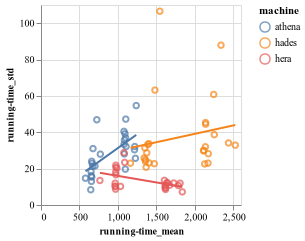

In [17]:
groupby(selected, [:status, :machine, :treatment]) |>
gs -> combine(gs, Symbol("running-time") => mean, 
                  Symbol("running-time") => std) |>
@vlplot(
    layer=[
        {mark=:point, x=Symbol("running-time_mean"), y=Symbol("running-time_std"), color=:machine},
        {mark=:line,
         transform=[{regression=Symbol("running-time_std"),
                     on=Symbol("running-time_mean"),
                     groupby=[:machine]}],
         y=Symbol("running-time_std"), x=Symbol("running-time_mean"), color=:machine}
        ],
    config={font="Times New Roman", axis={titleFontSize="10"}})

Seems like variance increases with running time, except for algol.

In [18]:
groupby(selected, [:machine]) |> gs -> combine(gs, Symbol("running-time")=>mean)

,machine,running-time_mean
,String,Float64
1,hades,1804.71
2,athena,901.475
3,hera,1327.03


Interesting fact, the difference between fastest and slowest machine is ~2x for bloat, but it's ~5x for avrora!

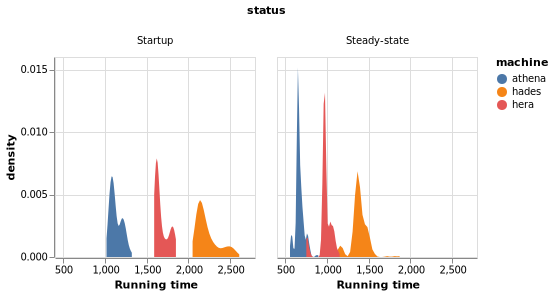

In [19]:
selected |>
@vlplot(
    column=:status,
    transform=[{density=Symbol("running-time"), groupby=[:status, :machine]}],
    mark=:area,
    x={field="value", type="quantitative", title="Running time"},
    y={field="density", type="quantitative"},
    color=:machine
)

We could use regression against the log of the running times, for three reasons:

1. Running time is always positive
2. The variance seems to increase with the running time
3. The distributions are skewed to the left (long-ish tail)

But I'll stick to a normal.

In [20]:
# We transform columns into arrays of indices
benchmarks = unique(selected[!, :benchmark]);
machines = unique(selected[!, :machine]);
treatments = unique(selected[!, :treatment]);
warmups = ["Startup", "Steady-state"]

selected[!, :warmup_ids] = indexin(selected[!, :status], warmups);
selected[!, :machine_ids] = indexin(selected[!, :machine], machines);
selected[!, :treatment_ids] = indexin(selected[!, :treatment], treatments);

In [21]:
# Now we process the running times
running_time_log = map(log, selected[!, Symbol("running-time")])

running_time_log_centered = running_time_log .- mean(running_time_log)

1560-element Vector{Float64}:
  0.5215884477506396
  0.10824646397138249
  0.5390293800638366
  0.12676551173862016
  0.5436913931696479
  0.0930342908701105
  0.5153876170067964
  0.1125506313049014
  0.5399635230556337
  0.0588810085448932
  0.49655103012031976
  0.09011031217867504
  0.5385619811303455
  ⋮
  0.3879891226509704
 -0.25533323249876627
  0.3808988284259458
 -0.17967527295128782
  0.3825395178834059
 -0.25636789373954283
  0.38907548886319177
 -0.24606914153896842
  0.3787070467266025
 -0.2308171936220722
  0.3901606761644789
 -0.24504507590927815

In [22]:
selected[!, :log_running_time] = running_time_log
selected[!, :centered_log_running_time] = running_time_log_centered

1560-element Vector{Float64}:
  0.5215884477506396
  0.10824646397138249
  0.5390293800638366
  0.12676551173862016
  0.5436913931696479
  0.0930342908701105
  0.5153876170067964
  0.1125506313049014
  0.5399635230556337
  0.0588810085448932
  0.49655103012031976
  0.09011031217867504
  0.5385619811303455
  ⋮
  0.3879891226509704
 -0.25533323249876627
  0.3808988284259458
 -0.17967527295128782
  0.3825395178834059
 -0.25636789373954283
  0.38907548886319177
 -0.24606914153896842
  0.3787070467266025
 -0.2308171936220722
  0.3901606761644789
 -0.24504507590927815

In [23]:
mean_rt = mean(selected[!,"running-time"])

1344.4038461538462

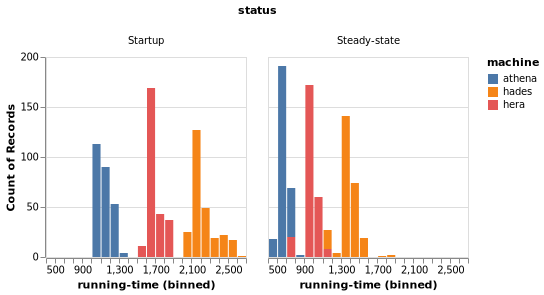

In [24]:
selected |>
@vlplot(
    column=:status,
    mark=:bar,
    x={field=:"running-time", bin={step=100}},
    y="count()",
    color=:machine
)

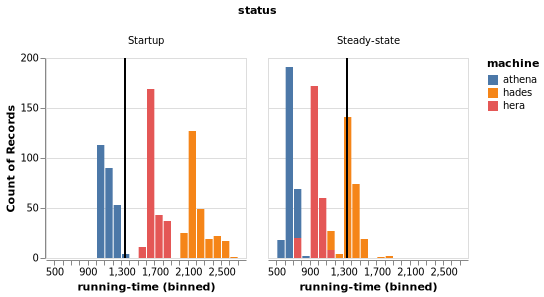

In [25]:
plot_distributions = selected |>
@vlplot(
    facet={column={field=:status}},
    spec={
        layer=[
        {mark=:bar,
         x={field=:"running-time", bin={step=100}},
         y="count()",
         color=:machine},
        {mark=:rule, x={datum=mean_rt}}
    ]
    },
)

In [26]:
save("figures/plot_experiment_distributons.pdf", plot_distributions)

# Statistical Models

To analyse the effect of each treatment (that is, how fast each variant runs compared to the original), we will use: 

1. A frequentist model
2. A no-pooling linear model
3. two hierarchical linear models. 

The hierarchical models are:

1. A model where the treatment effect doesn't vary with the context
2. A model where there is an interaction between context and treatment effect

## Training and test set

We'll split the data into training and test set.

In [27]:
selected[!,:running_time] = selected[!, Symbol("running-time")];

In [28]:
limit = 10

10

In [29]:
training = filter(r -> r[Symbol("jvm-invocation")] < limit, selected);

In [30]:
test = filter(r -> r[Symbol("jvm-invocation")] >= limit, selected);

In [31]:
nrow(training)

780

## Model 1.1: No interactions, Frequentist model

In [32]:
using GLM

In [33]:
contrasts = Dict(:label => StatsModels.DummyCoding(base="original"),
                 :machine => StatsModels.FullDummyCoding(),
                 :status => StatsModels.FullDummyCoding())

Dict{Symbol, AbstractContrasts} with 3 entries:
  :status  => FullDummyCoding()
  :label   => DummyCoding("original", nothing)
  :machine => FullDummyCoding()

In [34]:
@time(
freq_model = lm(@formula(centered_log_running_time ~ machine + status + treatment),
    training,
    contrasts = contrasts)
)

 12.457639 seconds (29.26 M allocations: 1.773 GiB, 4.55% gc time, 0.04% compilation time)


StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, LinearAlgebra.CholeskyPivoted{Float64, Matrix{Float64}}}}, Matrix{Float64}}

centered_log_running_time ~ 1 + machine + status + treatment

Coefficients:
────────────────────────────────────────────────────────────────────────────────────────────────────
                                   Coef.    Std. Error       t  Pr(>|t|)    Lower 95%      Upper 95%
────────────────────────────────────────────────────────────────────────────────────────────────────
(Intercept)                  -0.561704      0.00659626  -85.15    <1e-99   -0.574653    -0.548755
machine: athena               0.0         NaN           NaN       NaN     NaN          NaN
machine: hades                0.702215      0.00403937  173.84    <1e-99    0.694285     0.710144
machine: hera                 0.385622      0.00403937   95.47    <1e-99    0.377692     0.393551
status: Startup               0.512235      0.00329813  15

In [35]:
# With this you can show how the regression model encodes categorical variables.
StatsModels.modelmatrix(freq_model)

780×18 Matrix{Float64}:
 1.0  0.0  1.0  0.0  1.0  0.0  0.0  0.0  …  0.0  1.0  0.0  0.0  0.0  0.0  0.0
 1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0     0.0  1.0  0.0  0.0  0.0  0.0  0.0
 1.0  0.0  1.0  0.0  1.0  0.0  0.0  0.0     0.0  1.0  0.0  0.0  0.0  0.0  0.0
 1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0     0.0  1.0  0.0  0.0  0.0  0.0  0.0
 1.0  0.0  1.0  0.0  1.0  0.0  0.0  0.0     0.0  1.0  0.0  0.0  0.0  0.0  0.0
 1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  …  0.0  1.0  0.0  0.0  0.0  0.0  0.0
 1.0  0.0  1.0  0.0  1.0  0.0  0.0  0.0     0.0  1.0  0.0  0.0  0.0  0.0  0.0
 1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0     0.0  1.0  0.0  0.0  0.0  0.0  0.0
 1.0  0.0  1.0  0.0  1.0  0.0  0.0  0.0     0.0  1.0  0.0  0.0  0.0  0.0  0.0
 1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0     0.0  1.0  0.0  0.0  0.0  0.0  0.0
 1.0  0.0  1.0  0.0  1.0  0.0  0.0  0.0  …  0.0  1.0  0.0  0.0  0.0  0.0  0.0
 1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0     0.0  1.0  0.0  0.0  0.0  0.0  0.0
 1.0  0.0  1.0  0.0  1.0  0.0  0.0  0.0 

In [36]:
function R2(model, X::DataFrame, y::Vector{T}) where {T}
    predictions = predict(model, X)
    
    tss = y .- mean(y) |> x -> x.^2 |> sum
    ess = y .- predictions |> x -> x.^2 |> sum
    
    return 1 - ess / tss
end

R2 (generic function with 1 method)

In [37]:
R2(freq_model, 
   test[!, [:machine, :status, :treatment]],
   test[!, :centered_log_running_time]) |> x -> round(x, digits=3)

0.987

The frequentist model gets **98% accuracy on the test set**.

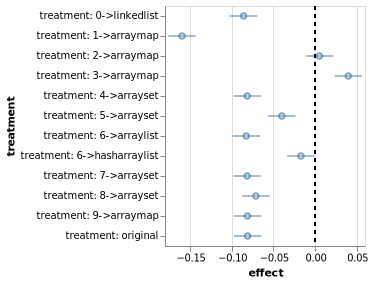

In [38]:
p_freq_0 = DataFrame(:coefficient => coefnames(freq_model),
    :coef => coef(freq_model),
    :stderr => stderror(freq_model),
    :coef_min => confint(freq_model)[:,1],
    :coef_max => confint(freq_model)[:,2]) |>
    df -> filter(r -> occursin("treatment", r[:coefficient]), df) |>
    @vlplot(
    y={field=:coefficient, title="treatment"},
    width=200,
    layer=[
        {mark=:point, x={field=:coef, scale={zero=false}, title="effect"}},
        {mark={:rule, color="steelblue"}, x=:coef_min, x2=:coef_max},
        {mark={type=:rule, strokeDash=[4,4]}, x={datum=0.0}, y={value=0.0}, y2={value="height"}}
    ]
)

In [39]:
save("figures/plot_effects_no_interaction_freq_$benchmark.svg", p_freq_0)

This plot looks exactly like the plot you obtain from the bayesian model (no interactions)

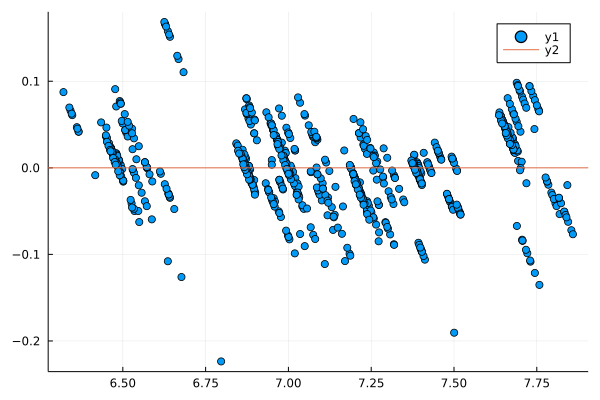

In [40]:
# Residuals
residuals_test = predict(freq_model, test[!, [:machine,:treatment,:status]]) .- test[!, :centered_log_running_time]

scatter(test[!, :log_running_time], residuals_test)
    
hline!([0.0])

In [41]:
fit(Normal, residuals_test)

Normal{Float64}(μ=0.0009916147488392105, σ=0.0451577138711118)

In [42]:
using Distributions

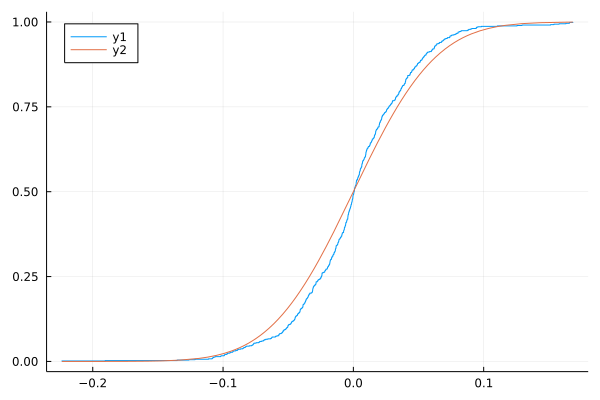

In [43]:
ecdfplot(residuals_test)
plot!(x -> cdf(Normal(0.0, 0.05), x))

Seems like we can safely assume that noise is normally distributed.

# Model 1.2: Frequentist model with interactions

In [44]:
# Let's try with interactions.
@time(
freq_model_interactions = lm(
    @formula(centered_log_running_time ~ 1 + machine + status + (treatment & (status + machine))),
    training,
    contrasts = contrasts
)
)

  3.877574 seconds (5.57 M allocations: 350.273 MiB, 3.74% gc time, 99.58% compilation time)


StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, LinearAlgebra.CholeskyPivoted{Float64, Matrix{Float64}}}}, Matrix{Float64}}

centered_log_running_time ~ 1 + machine + status + treatment & status + treatment & machine

Coefficients:
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
                                                          Coef.    Std. Error       t  Pr(>|t|)      Lower 95%     Upper 95%
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
(Intercept)                                         -0.614985      0.00791845  -77.66    <1e-99   -0.630531      -0.599439
machine: athena                                      0.0         NaN           NaN       NaN     NaN            NaN
machine: hades                                       0.72345       0.00969809   74.60    <1e-99    0.

In [45]:
r2(freq_model_interactions)

0.9942497696311137

In [46]:
R2(freq_model_interactions,
    test[!, [:machine, :status, :treatment]],
    test[!, :centered_log_running_time]) |> x -> round(x, digits=3)

0.994

The frequentist model with interactions has an **accuracy of 99%**. 

In [47]:
function parse_coef_label(label)
    kvps = split(label, "&") |> words -> map(x -> strip(x), words)
    
    pairs = []
    
    for kvp in kvps
        splitted = split(kvp, ":")
        k = strip(splitted[1])
        v = strip(splitted[2])
        append!(pairs, [(k => v)])
    end
    
    return Dict(pairs)
end

parse_coef_label (generic function with 1 method)

In [48]:
function DataFrame(lin_model::StatsModels.TableRegressionModel)
    records = []
    
    for i in 1:length(coefnames(lin_model))
        name = coefnames(lin_model)[i]
        if name == "(Intercept)"
            continue 
        end
        interaction_info = parse_coef_label(name)
        
        value = coef(lin_model)[i]
        value_intervals = confint(lin_model)[i,:]
        
        record = (treatment=get(interaction_info,"treatment", missing),
            machine=get(interaction_info, "machine", missing),
            status=get(interaction_info, "status", missing),
            value=value,
            min=value_intervals[1],
            max=value_intervals[2])
        
        append!(records, [record])
    end
    return DataFrame(records)
end

DataFrame

In [49]:
model_df = DataFrame(freq_model_interactions)

,treatment,machine,status,value,min,max
,SubStrin…?,SubStrin…?,SubStrin…?,Float64,Float64,Float64
1,missing,athena,missing,0.0,NaN,NaN
2,missing,hades,missing,0.72345,0.70441,0.742489
3,missing,hera,missing,0.392928,0.373888,0.411967
4,missing,missing,Startup,0.59977,0.584224,0.615315
5,missing,missing,Steady-state,0.0,NaN,NaN
6,0->linkedlist,missing,Startup,-0.139946,-0.161931,-0.117961
7,1->arraymap,missing,Startup,-0.144638,-0.166623,-0.122653
8,2->arraymap,missing,Startup,-0.0831461,-0.105131,-0.0611611
9,3->arraymap,missing,Startup,-0.057729,-0.079714,-0.035744


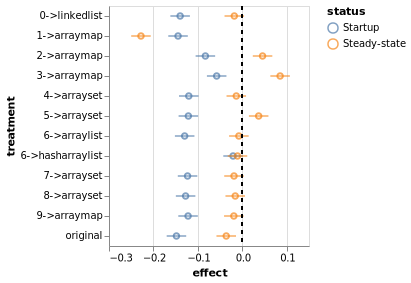

In [50]:
model_df |>
    df -> filter(r -> !ismissing(r[:treatment]), df) |>
    df -> filter(r -> !ismissing(r[:status]), df) |>
    @vlplot(
    y=:treatment,
    x={field=:value, title="effect", zero=false},
    layer=[
        {mark=:point, x={field=:value, scale={zero=false}}, y=:treatment, color=:status},
        {mark=:rule, x=:min, x2=:max, y=:treatment, color=:status},
        {mark={type=:rule, strokeDash=[4,4]}, x={datum=0.0}, y={value=0.0}, y2={value="height"}}
    ]
)

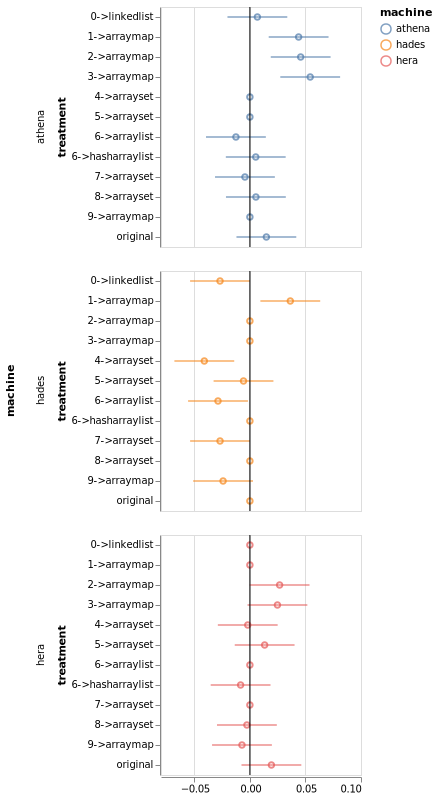

In [51]:
p_freq_interactions = model_df |>
    df -> filter(r -> !ismissing(r[:treatment]), df) |>
    df -> filter(r -> !ismissing(r[:machine]), df) |>
    @vlplot(
    facet={row={field=:machine}},
    spec={layer=[
        {mark=:point, x={field=:value, scale={zero=false}}, y=:treatment, color=:machine},
        {mark=:rule, x=:min, x2=:max, y=:treatment, color=:machine},
        {mark=:rule, x=[0.0]},
        ],
        # height=45
    },
)

In [52]:
save("figures/plot_effect_machine_treatment_freq_$benchmark.svg",p_freq_interactions)

In [53]:
ftest(freq_model.model, freq_model_interactions.model)

F-test: 2 models fitted on 780 observations
────────────────────────────────────────────────────────────────
     DOF  ΔDOF     SSR     ΔSSR      R²     ΔR²       F*   p(>F)
────────────────────────────────────────────────────────────────
[1]   17        1.6206           0.9864                         
[2]   53    36  0.6847  -0.9359  0.9942  0.0079  27.6396  <1e-99
────────────────────────────────────────────────────────────────

We can see:

- the second model gets fits the data a bit better.
- t2 is slightly faster on m3 than on m1, m2
- t2 is much faster in steady state

## Summary of Frequentist regression

These plots are similar to what we will obtain with the Bayesian model, except in the Frequentist case, I get the interaction of treatment and machine relative to `sde-pascal` (I don't know why). Apart from that, the coefficients (and the error) we get are similar to what we will obtain through the Bayesian model.

The frequentist models are *very* accurate already, with only three jvm iterations.

# Bayesian Models

In [54]:
using Turing, FillArrays, Distributions, LinearAlgebra

In [55]:
@model function treatment_model_no_context(
        nmachines,
        ntreatments,
        machine_idxs, warmup_idxs, treatment_idxs,
        running_time_obs_std, ::Type{T}=Float64) where T
    
    # We assume the mean running time is zero
    # (I think I have enough data-points to assume
    # there's little uncertainty about that, and centering is enough)

    # Effect of the machine
    effect_machine ~ MvNormal(Fill(0.0, nmachines), 0.5)

    # Effect of the warmup
    effect_warmup ~ MvNormal(Fill(0.0, 2), 0.3)
    
    # Effect of treatment
    effect_treatment ~ MvNormal(Fill(0.0, ntreatments), 0.2)

    sigma ~ Exponential(0.1)

    N = length(running_time_obs_std)
    running_time = Vector{T}(undef, N)
    for i in 1:N
        machine_i = machine_idxs[i]
        warmup_i = warmup_idxs[i]
        treatment_i = treatment_idxs[i]

        effects_jvm = effect_machine[machine_i] + effect_warmup[warmup_i]

        # 0.0 is the average time
        running_time[i] = effects_jvm + effect_treatment[treatment_i]

        running_time_obs_std[i] ~ Normal(running_time[i], sigma)
    end
    
    # Useful for the Bayesian R2
    line_variance = var(running_time)
    residuals_variance = sigma*sigma
    R2 = line_variance / (line_variance + residuals_variance)
   
    return (finite_sd_machine=std(effect_machine),
            finite_sd_warmup=std(effect_warmup),
            finite_sd_treatments=std(effect_treatment),
            finite_sd_residuals=std(running_time .- running_time_obs_std),
            r2=R2)
end

treatment_model_no_context (generic function with 3 methods)

In [56]:
function sample_model(model::DynamicPPL.Model)
    # These lines made the model go from 10 minutes / chain to 1 minute / chain (!)
    # Source: https://discourse.julialang.org/t/multi-level-varying-slopes-with-two-clusters-cross-classification/62036/6?u=neal
    # Turing.setadbackend(:reversediff)
    # Turing.setrdcache(true)

    nuts_sampler = NUTS(0.7)

    chain = sample(model, nuts_sampler, MCMCSerial(), 1000, 4)

    return chain
end

sample_model (generic function with 1 method)

In [57]:
model_h0 = treatment_model_no_context(length(machines),
                                      length(treatments),
                                      training[!, :machine_ids], 
                                      training[!, :warmup_ids],
                                      training[!, :treatment_ids],
                                      training[!, :centered_log_running_time])

DynamicPPL.Model{typeof(treatment_model_no_context), (:nmachines, :ntreatments, :machine_idxs, :warmup_idxs, :treatment_idxs, :running_time_obs_std, Symbol("##arg#287")), (Symbol("##arg#287"),), (), Tuple{Int64, Int64, Vector{Union{Nothing, Int64}}, Vector{Union{Nothing, Int64}}, Vector{Union{Nothing, Int64}}, Vector{Float64}, DataType}, Tuple{DataType}, DynamicPPL.DefaultContext}(treatment_model_no_context, (nmachines = 3, ntreatments = 13, machine_idxs = Union{Nothing, Int64}[1, 1, 1, 1, 1, 1, 1, 1, 1, 1  …  3, 3, 3, 3, 3, 3, 3, 3, 3, 3], warmup_idxs = Union{Nothing, Int64}[1, 2, 1, 2, 1, 2, 1, 2, 1, 2  …  1, 2, 1, 2, 1, 2, 1, 2, 1, 2], treatment_idxs = Union{Nothing, Int64}[1, 1, 1, 1, 1, 1, 1, 1, 1, 1  …  13, 13, 13, 13, 13, 13, 13, 13, 13, 13], running_time_obs_std = [0.5215884477506396, 0.10824646397138249, 0.5390293800638366, 0.12676551173862016, 0.5436913931696479, 0.0930342908701105, 0.5153876170067964, 0.1125506313049014, 0.5399635230556337, 0.0588810085448932  …  0.393949584

In [185]:
@time(
chain_simple_h0 = sample_model(model_h0)
)

┌ Info: Found initial step size
│   ϵ = 0.05
└ @ Turing.Inference /home/noric/.julia/packages/Turing/Tpj0b/src/inference/hmc.jl:188
Sampling (Chain 1 of 4): 100%|██████████████████████████| Time: 0:00:47
┌ Info: Found initial step size
│   ϵ = 0.05
└ @ Turing.Inference /home/noric/.julia/packages/Turing/Tpj0b/src/inference/hmc.jl:188
Sampling (Chain 2 of 4): 100%|██████████████████████████| Time: 0:00:37
┌ Info: Found initial step size
│   ϵ = 0.025
└ @ Turing.Inference /home/noric/.julia/packages/Turing/Tpj0b/src/inference/hmc.jl:188
Sampling (Chain 3 of 4): 100%|██████████████████████████| Time: 0:00:54


LoadError: InterruptException:

In [186]:
chain_simple_h0

Chains MCMC chain (1000×34×4 Array{Float64, 3}):

Iterations        = 501:1:1500
Number of chains  = 4
Samples per chain = 1000
Wall duration     = 348.01 seconds
Compute duration  = 347.9 seconds
parameters        = sigma_machines, effect_machine[1], effect_machine[2], effect_machine[3], sigma_warmup, effect_warmup[1], effect_warmup[2], sigma_treatments, effect_treatment[1], effect_treatment[2], effect_treatment[3], effect_treatment[4], effect_treatment[5], effect_treatment[6], effect_treatment[7], effect_treatment[8], effect_treatment[9], effect_treatment[10], effect_treatment[11], effect_treatment[12], effect_treatment[13], sigma
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
            parameters      mean       std   naive_se      mcse         ess    ⋯
                Symbol   Float64   Float64    Float64 

In [187]:
plot(chain_simple_h0)

## Model 2.1: Context does not matter

We assume that the machine used and the warmup effect have an effect on the runtime, but the effect of a treatment (collection change) is the same regardless.

## Machines
We set a prior on the effect of the machine, compared to the mean. The effect is normally distributed with mean 0.0 and $\sigma$ inferred from the data. There is one independent effect for each machine, but the standard deviation is pooled across machines.

$$
\sigma_{machines} \sim \text{Exponential}(0.5)\\
\alpha_{m} \sim \text{Normal}(0.0, \sigma_{machines})
$$

## Warmup
We set a similar prior for the effect of warmup: Normally distributed, with a $\sigma$ that is learned from the data. There are two warmup states, so two priors.

$$
\sigma_{warmups} \sim \text{Exponential}(0.5)\\
\beta_{startup} \sim \text{Normal}(0.0, \sigma_{warmups})\\
\beta_{steady} \sim \text{Normal}(0.0, \sigma_{warmups})
$$

## Treatments
Similarly, for each treatment, we set a Normal prior for its effect, but the $\sigma$ of the distribution is learned from the data. Instead of using an exponential prior, we use a truncated Normal. The reason for this is that the thinner tail of the normal helps with sampling. 

$$
\sigma_{treatments} \sim \text{Exponential}(0.1)\\
\gamma_{t} \sim \text{Normal}(0.0, \sigma_{treatments})\\
$$


## Likelihood
We consider the log running time of the program is the sum of these effects plus some gaussian noise.

$$
\mu_j = \alpha_{M[j]} + \beta_{W[j]} + \gamma_{T[j]}\\
\sigma \sim \text{Exponential(0.1)}\\
\log(\text{running_time}_j) \sim \text{Normal}(\mu_j, \sigma)\\
$$

In [58]:
@model function treatment_model_no_context(
        nmachines,
        ntreatments,
        machine_idxs, warmup_idxs, treatment_idxs,
        running_time_obs_std, ::Type{T}=Float64) where T
    
    # We assume the mean running time is zero
    # (I think I have enough data-points to assume
    # there's little uncertainty about that, and centering is enough)

    # Effect of the machine
    sigma_machines ~ Exponential(0.4)
    effect_machine ~ MvNormal(Fill(0.0, nmachines), sigma_machines)

    # Effect of the warmup
    sigma_warmup ~ Exponential(0.4)
    effect_warmup ~ MvNormal(Fill(0.0, 2), sigma_warmup)
    
    # Effect of treatment
    sigma_treatments ~ Exponential(0.1)
    effect_treatment ~ MvNormal(Fill(0.0, ntreatments), sigma_treatments)

    sigma ~ Exponential(0.1)

    N = length(running_time_obs_std)
    running_time = Vector{T}(undef, N)
    for i in 1:N
        machine_i = machine_idxs[i]
        warmup_i = warmup_idxs[i]
        treatment_i = treatment_idxs[i]

        effects_jvm = effect_machine[machine_i] + effect_warmup[warmup_i]

        # 0.0 is the average time
        running_time[i] = effects_jvm + effect_treatment[treatment_i]

        running_time_obs_std[i] ~ Normal(running_time[i], sigma)
    end
    
    # Useful for the Bayesian R2
    line_variance = var(running_time)
    residuals_variance = sigma*sigma
    R2 = line_variance / (line_variance + residuals_variance)
   
    return (finite_sd_machine=std(effect_machine),
            finite_sd_warmup=std(effect_warmup),
            finite_sd_treatments=std(effect_treatment),
            finite_sd_residuals=std(running_time .- running_time_obs_std),
            r2=R2)
end

treatment_model_no_context (generic function with 3 methods)

# Inference

In [59]:
model_h0 = treatment_model_no_context(length(machines),
                                      length(treatments),
                                      training[!, :machine_ids], 
                                      training[!, :warmup_ids],
                                      training[!, :treatment_ids],
                                      training[!, :centered_log_running_time])

DynamicPPL.Model{typeof(treatment_model_no_context), (:nmachines, :ntreatments, :machine_idxs, :warmup_idxs, :treatment_idxs, :running_time_obs_std, Symbol("##arg#315")), (Symbol("##arg#315"),), (), Tuple{Int64, Int64, Vector{Union{Nothing, Int64}}, Vector{Union{Nothing, Int64}}, Vector{Union{Nothing, Int64}}, Vector{Float64}, DataType}, Tuple{DataType}, DynamicPPL.DefaultContext}(treatment_model_no_context, (nmachines = 3, ntreatments = 13, machine_idxs = Union{Nothing, Int64}[1, 1, 1, 1, 1, 1, 1, 1, 1, 1  …  3, 3, 3, 3, 3, 3, 3, 3, 3, 3], warmup_idxs = Union{Nothing, Int64}[1, 2, 1, 2, 1, 2, 1, 2, 1, 2  …  1, 2, 1, 2, 1, 2, 1, 2, 1, 2], treatment_idxs = Union{Nothing, Int64}[1, 1, 1, 1, 1, 1, 1, 1, 1, 1  …  13, 13, 13, 13, 13, 13, 13, 13, 13, 13], running_time_obs_std = [0.5215884477506396, 0.10824646397138249, 0.5390293800638366, 0.12676551173862016, 0.5436913931696479, 0.0930342908701105, 0.5153876170067964, 0.1125506313049014, 0.5399635230556337, 0.0588810085448932  …  0.393949584

In [60]:
@time(
chain_h0 = sample_model(model_h0)
)

┌ Info: Found initial step size
│   ϵ = 0.0125
└ @ Turing.Inference /home/noric/.julia/packages/Turing/Tpj0b/src/inference/hmc.jl:188
Sampling (Chain 1 of 4): 100%|██████████████████████████| Time: 0:01:20
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /home/noric/.julia/packages/AdvancedHMC/iWHPQ/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /home/noric/.julia/packages/AdvancedHMC/iWHPQ/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, true, true, false)
└ @ AdvancedHMC /home/noric/.julia/packages/AdvancedHMC/iWHPQ/src/hamiltonian.jl:47
┌ Info: Found initial step size
│   ϵ = 0.0015625
└ @ Turing.Inference /home/noric/.julia/packages/Turing/Tpj0b/src/inference/hmc.jl:188

415.016287 seconds (284.23 M allocations: 575.337 GiB, 8.03% gc time, 0.14% compilation time)


Chains MCMC chain (1000×34×4 Array{Float64, 3}):

Iterations        = 501:1:1500
Number of chains  = 4
Samples per chain = 1000
Wall duration     = 400.19 seconds
Compute duration  = 397.35 seconds
parameters        = sigma_machines, effect_machine[1], effect_machine[2], effect_machine[3], sigma_warmup, effect_warmup[1], effect_warmup[2], sigma_treatments, effect_treatment[1], effect_treatment[2], effect_treatment[3], effect_treatment[4], effect_treatment[5], effect_treatment[6], effect_treatment[7], effect_treatment[8], effect_treatment[9], effect_treatment[10], effect_treatment[11], effect_treatment[12], effect_treatment[13], sigma
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
            parameters      mean       std   naive_se      mcse         ess    ⋯
                Symbol   Float64   Float64    Float64

In [61]:
ess_rhat(chain_h0)

ESS
            parameters         ess      rhat   ess_per_sec 
                Symbol     Float64   Float64       Float64 

        sigma_machines   1568.6514    1.0031        3.9478
     effect_machine[1]    716.5826    1.0034        1.8034
     effect_machine[2]    717.9043    1.0034        1.8067
     effect_machine[3]    716.7488    1.0034        1.8038
          sigma_warmup   1503.6294    1.0021        3.7841
      effect_warmup[1]    714.8931    1.0043        1.7992
      effect_warmup[2]    715.3109    1.0043        1.8002
      sigma_treatments   1370.6217    1.0017        3.4494
   effect_treatment[1]    324.9759    1.0217        0.8179
   effect_treatment[2]    337.1706    1.0215        0.8485
   effect_treatment[3]    338.2365    1.0225        0.8512
   effect_treatment[4]    304.9009    1.0214        0.7673
   effect_treatment[5]    370.7998    1.0207        0.9332
   effect_treatment[6]    313.6348    1.0212        0.7893
   effect_treatment[7]    392.0259    1.0210     

In [62]:
plot(chain_h0)

In [63]:
fit(LogNormal,chain_h0[:sigma_machines])

LogNormal{Float64}(μ=-0.9868339767500895, σ=0.4228864599920448)

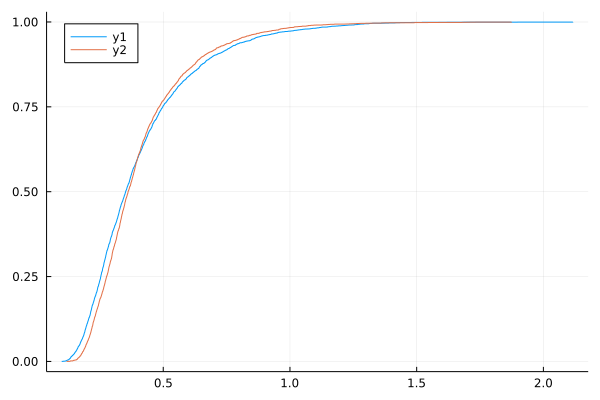

In [114]:
ecdfplot(chain_h0[:sigma_warmup] |> vec)
ecdfplot!(chain_h0[:sigma_machines] |> vec)

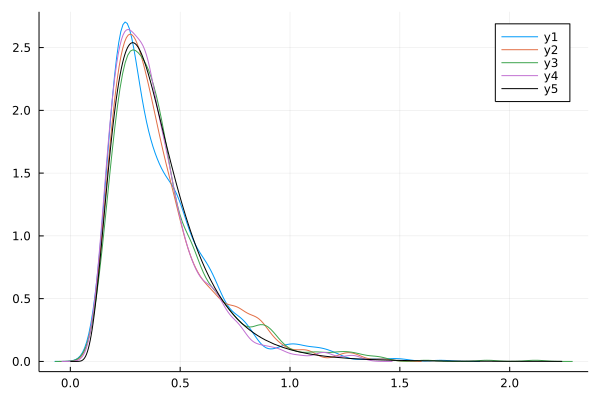

In [64]:
density(chain_h0[:sigma_warmup])
plot!(fit(LogNormal, chain_h0[:sigma_warmup]), color="black")

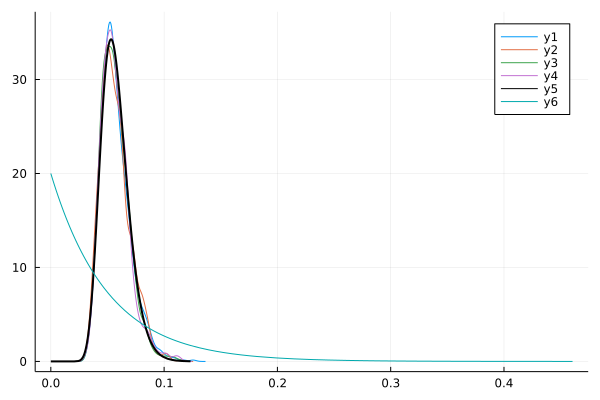

In [65]:
density(chain_h0[:sigma_treatments])
plot!(fit(LogNormal, chain_h0[:sigma_treatments]), linewidth=2.0, color="black")
plot!(Exponential(0.05))

In [66]:
fit(LogNormal, chain_h0[:sigma_treatments])

LogNormal{Float64}(μ=-2.888546706341004, σ=0.2139021901045218)

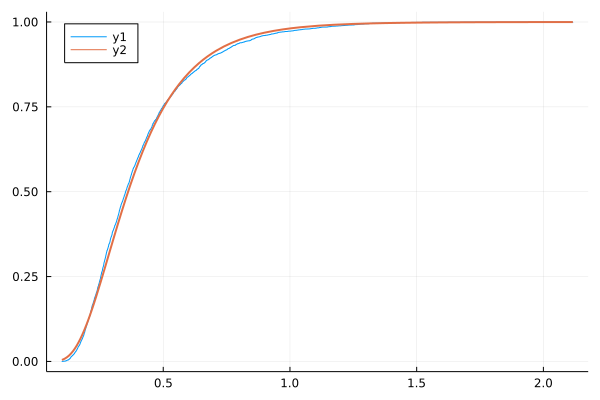

In [67]:
ecdfplot(chain_h0[:sigma_warmup] |> vec)
plot!(x -> cdf(fit(LogNormal, chain_h0[:sigma_warmup]), x), linewidth=2)

We can see that we $\sigma$s started as exponential, but now they look like log-normal distributions. If we want, we can use that posterior as a prior in our next model! 

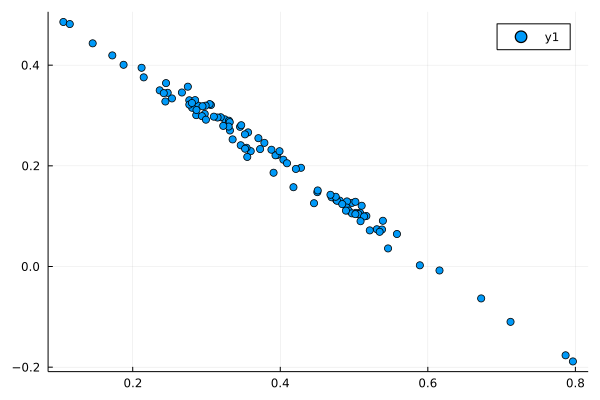

In [68]:
scatter(chain_h0["effect_machine[1]"][1:100], chain_h0["effect_warmup[1]"][1:100])

This high correlation between machine effects and warmup effects is explained by the model: Since the running time is proportional to the *sum* of `effect_machine[1]` and `effect_warmup[1]`, increasing the first requires to decrease the other. This effect ripples to other variables (all `effect_machine` are increased). As a result, `effect_machine[1]` and `effect_machine[2]` are highly correlated. 

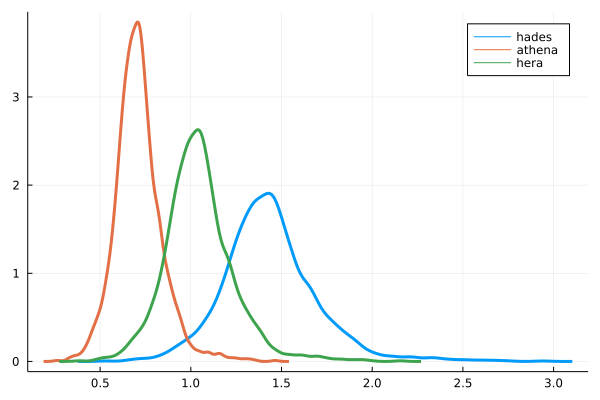

In [124]:
p_machine = plot()


sigma_machines_est = chain_h0["sigma_machines"] |> vec |> mean


# plot!(p, Normal(0.0, sigma_machines_est), fill=true, color="black", opacity=0.15, label=missing)


for m in 1:3
    density!(p_machine, chain_h0["effect_machine[$m]"] |> vec |> v -> map(exp, v),
        label=machines[m],
        linewidth=3)
end


p_machine

In [125]:
savefig(p_machine, "figures/plot_family_distribution_$benchmark.pdf")

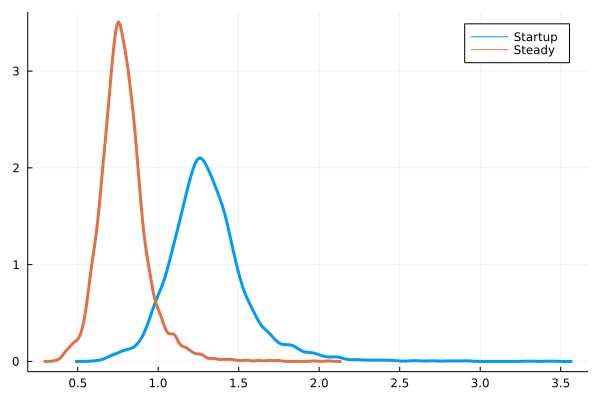

In [126]:
p_warmup = density(chain_h0["effect_warmup[1]"] |> vec |> v -> map(exp, v), w=3, label="Startup")

density!(p_warmup, chain_h0["effect_warmup[2]"] |> vec |> v -> map(exp, v), w=3, label="Steady")

In [127]:
savefig(p_warmup,"figures/plot_warmup_distribution_$benchmark.pdf")

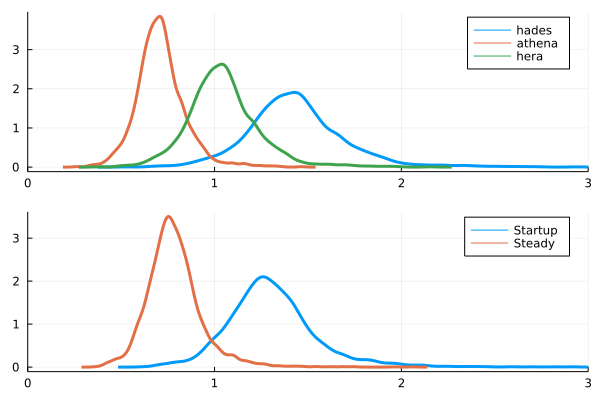

In [128]:
p_combined = plot(p_machine, p_warmup, layout=(2,1), xrange=(0, 3))

In [129]:
savefig(p_combined, "figures/plot_effects_combined.pdf")

# Analysis

We can now use the chain of samples to investigate how well the model work, and what it says.

## Posterior predictive accuracy

We try to see if the model can predict accurately the log running times. We need to create a new model, but we use the chain we obtained from the training set.

In [71]:
# Same model, but we pass "missing" as data, so the model tries to guess it.
model_pred_h0 = treatment_model_no_context(length(machines),
                                           length(treatments),
                                           test[!, :machine_ids], 
                                           test[!, :warmup_ids],
                                           test[!, :treatment_ids],
                                           repeat([missing], nrow(test)))

DynamicPPL.Model{typeof(treatment_model_no_context), (:nmachines, :ntreatments, :machine_idxs, :warmup_idxs, :treatment_idxs, :running_time_obs_std, Symbol("##arg#315")), (Symbol("##arg#315"),), (), Tuple{Int64, Int64, Vector{Union{Nothing, Int64}}, Vector{Union{Nothing, Int64}}, Vector{Union{Nothing, Int64}}, Vector{Missing}, DataType}, Tuple{DataType}, DynamicPPL.DefaultContext}(treatment_model_no_context, (nmachines = 3, ntreatments = 13, machine_idxs = Union{Nothing, Int64}[1, 1, 1, 1, 1, 1, 1, 1, 1, 1  …  3, 3, 3, 3, 3, 3, 3, 3, 3, 3], warmup_idxs = Union{Nothing, Int64}[1, 2, 1, 2, 1, 2, 1, 2, 1, 2  …  1, 2, 1, 2, 1, 2, 1, 2, 1, 2], treatment_idxs = Union{Nothing, Int64}[1, 1, 1, 1, 1, 1, 1, 1, 1, 1  …  13, 13, 13, 13, 13, 13, 13, 13, 13, 13], running_time_obs_std = [missing, missing, missing, missing, missing, missing, missing, missing, missing, missing  …  missing, missing, missing, missing, missing, missing, missing, missing, missing, missing], ##arg#315 = Float64), (##arg#315

In [72]:
predictions_h0 = predict(model_pred_h0, chain_h0) |> mean |> x -> x.nt.mean

780-element Vector{Float64}:
  0.5696244161674244
  0.05662209255091776
  0.5697534502030164
  0.05845970413157453
  0.5693550889602287
  0.05832644563944558
  0.5700714129461057
  0.05836004485906999
  0.5699546285882086
  0.05778852518756059
  0.5708079653621255
  0.058584854516963734
  0.5710752905439724
  ⋮
  0.33512185167229597
 -0.17632561179220085
  0.33610841120529045
 -0.17711226569898417
  0.33659236077110777
 -0.17698221290608138
  0.3357490981148245
 -0.17667035401758371
  0.3358971930627597
 -0.17577749229849407
  0.3357018989490507
 -0.17657979457550538

In [73]:
using Statistics

function r2bayes(data, predictions)
    total_sum_sq = (data .- mean(data)).^2 |> sum

    reg_sum_sq = (data .- predictions).^2 |> sum

    return 1 - reg_sum_sq / total_sum_sq
end

r2bayes (generic function with 1 method)

In [74]:
r2bayes(test[!, :centered_log_running_time],
        predictions_h0)

0.9866074998242897

In [75]:
# Let's plot the Bayesian R2 as described in (Gelman 2021)
generated_h0 = generated_quantities(model_pred_h0, chain_h0);

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
Excessive output truncated after 525048 bytes.┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian

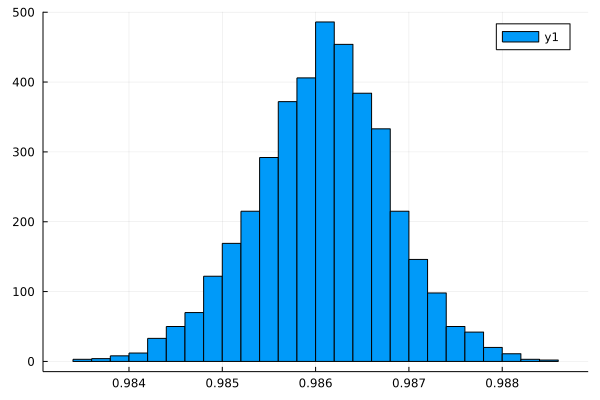

In [76]:
r2_h0 = map(x -> x.r2, generated_h0) |> vec
histogram(r2_h0)

# Plotting effects

In [77]:
function chain_h0_to_df(chain, treatments)
    records = []
    
    baseline = indexin(["original"], treatments)[1]
    
    baseline_samples = vec(chain["effect_treatment[$baseline]"])
    
    records = []
    
    for t_i in 1:length(treatments)
        t = treatments[t_i]

        if t_i == baseline
            continue
        end
        
        samples = vec(chain["effect_treatment[$t_i]"]) .- baseline_samples |> s -> exp.(s)
        
        record = (treatment=t,
            effect_med=(quantile(samples, 0.5)), 
            effect_50_min=(quantile(samples, 0.25)),
            effect_50_max=(quantile(samples, 0.75)),
            effect_95_min=(quantile(samples, 0.025)),
            effect_95_max=(quantile(samples, 0.975)))
        
        append!(records, [record])
    end

    return DataFrame(records)
end

chain_h0_to_df (generic function with 1 method)

In [78]:
df_h0 = chain_h0_to_df(chain_h0, treatments)

,treatment,effect_med,effect_50_min,effect_50_max,effect_95_min,effect_95_max
,String31,Float64,Float64,Float64,Float64,Float64
1,6->arraylist,0.998146,0.992674,1.00386,0.982118,1.0147
2,9->arraymap,0.999643,0.994381,1.0051,0.983819,1.01614
3,8->arrayset,1.00975,1.00414,1.01528,0.99305,1.02691
4,7->arrayset,0.999511,0.993688,1.00493,0.982832,1.016
5,6->hasharraylist,1.06508,1.05916,1.0713,1.04802,1.08309
6,5->arrayset,1.04141,1.03541,1.04729,1.02433,1.05812
7,4->arrayset,0.999284,0.993872,1.00523,0.982844,1.01593
8,3->arraymap,1.12681,1.12064,1.1331,1.10824,1.1459
9,2->arraymap,1.08876,1.08277,1.09498,1.07105,1.10701


In [79]:
using VegaLite

In [80]:
treatment_family_low = chain_h0["sigma_treatments"] * -1 |> vec |> v -> quantile(v, [0.25, 0.5, 0.75]) |> v -> map(exp, v)
treatment_family_high = chain_h0["sigma_treatments"] |> vec |> v -> quantile(v, [0.75, 0.5, 0.25]) |> v -> map(exp, v)

3-element Vector{Float64}:
 1.066061172943565
 1.0565041710649294
 1.0490378399190754

In [81]:
df_filtered = filter(r -> !(r[:effect_50_min] < 1.0 && r[:effect_50_max] > 1.0), df_h0)

,treatment,effect_med,effect_50_min,effect_50_max,effect_95_min,effect_95_max
,String31,Float64,Float64,Float64,Float64,Float64
1,8->arrayset,1.00975,1.00414,1.01528,0.99305,1.02691
2,6->hasharraylist,1.06508,1.05916,1.0713,1.04802,1.08309
3,5->arrayset,1.04141,1.03541,1.04729,1.02433,1.05812
4,3->arraymap,1.12681,1.12064,1.1331,1.10824,1.1459
5,2->arraymap,1.08876,1.08277,1.09498,1.07105,1.10701
6,1->arraymap,0.925171,0.919814,0.930285,0.909992,0.94042
7,0->hasharraylist,1.08308,1.07698,1.08931,1.06577,1.10105


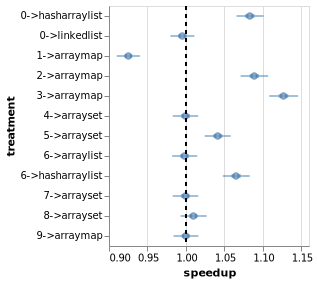

In [90]:
plot_effects_no_interaction = 
    df_h0 |> @vlplot(
            y=:treatment,
            #x={scale={domain=(0.9, 1.1), nice=false}},
            width=200,
            layer=[
            {mark={type=:rule, color=:steelblue}, x=:effect_95_min, x2=:effect_95_max},
            {mark={type=:rule, color=:steelblue, strokeWidth=4, opacity=0.5},x=:effect_50_min, x2=:effect_50_max},
            {mark={type=:point}, x={field=:effect_med, scale={zero=false}, title="speedup"}},
            {mark={type=:rule, strokeDash=[4,4]}, x={datum=1.0}, y={value=0.0}, y2={value="height"}},
            ])

In [123]:
save("figures/plot_effects_no_interaction_$benchmark.pdf", plot_effects_no_interaction)

In [92]:
mean(chain_h0["sigma_treatments"])

0.05697286620237416

# Model 2.2: Context does matter


This is almost the same model, but the machine and warmup interact with the effect of treatment.

## Machines
We set a prior on the effect of the machine, compared to the mean. The effect is normally distributed with mean 0.0 and $\sigma$ inferred from the data. There is one independent effect for each machine, but the standard deviation is pooled across machines.

$$
\sigma_{machines} \sim \text{Exponential}(0.5)\\
\bar{\alpha}_{m} \sim \text{Normal}(0.0, \sigma_{machine})
$$

## Warmup
We set a similar prior for the effect of warmup: Normally distributed, with a $\sigma$ that is learned from the data. There are two warmup states, so two priors.

$$
\sigma_{warmup} \sim \text{Exponential}(0.5)\\
\bar{\beta}_{startup} \sim \text{Normal}(0.0, \sigma_{warmup})\\
\bar{\beta}_{steady} \sim \text{Normal}(0.0, \sigma_{warmup})
$$

## Interactions
We are not only interested in the effect of the treatment. We're interested in how the effect of treatment *changes* with a different machine, or after warming up. Therefore, we add priors for an interaction term between the machine and the treatment, and another for the interaction between warmup and treatment.

### Treatment + Machine

$$
\sigma_{\text{interations_machine}} \sim \text{Exponential}(0.1)\\
\alpha_{m, t} \sim \text{Normal}(0.0, \sigma_{\text{interations_machine}})\\
$$

### Treatment + Warmup

$$
\sigma_{\text{interations_warmup}} \sim \text{Exponential}(0.1)\\
\beta_{warmup, t} \sim \text{Normal}(0.0, \sigma_{\text{interations_machine}})\\
\beta_{steady, t} \sim \text{Normal}(0.0, \sigma_{\text{interations_machine}})
$$

## Likelihood
We consider the log running time of the program is the sum of these effects plus some gaussian noise.

$$
\log(\text{running_time}_j) \sim \text{Normal}(\mu_j, \sigma)\\
\mu_j = \bar{\alpha}_{M[j]} + \alpha_{M[j], T[j]} + \bar{\beta}_{W[j]} + \beta_{W[j], T[j]}\\
\sigma \sim \text{Exponential(0.1)}
$$

In [217]:
# Model for treatment + interaction for machine + interaction for warmup
# Because I saw that if you split it in two different models, the estimation of MAIN effect of the treatment
# changes a bit!
@model function treatment_model_interactions(
        nmachines, ntreatments,
        machine_idxs, warmup_idxs, treatment_idxs,
        running_time_obs_std, ::Type{T}=Float64) where T

    # We assume the mean running time is zero
    # (I think I have enough data-points to assume
    # there's little uncertainty about that, and centering is enough)

    # Effect of the machine
    sigma_machines ~ Exponential(0.5)
    # This is the posterior for model h0
    # sigma_machines ~ LogNormal(-1, 0.5)
    effect_machine ~ MvNormal(Fill(0.0, nmachines), sigma_machines)

    # Effect of the warmup
    # sigma_warmup ~ Exponential(0.5)
    # This is the posterior for model h0
    sigma_warmup ~ LogNormal(-1, 0.5)
    effect_warmup ~ MvNormal(Fill(0.0, 2), sigma_warmup)
    
    # Interaction warmup + machine
    # sigma_interactions_machine_warmup ~ Exponential(0.4)
    # effect_machine_warmup ~ filldist(Normal(0.0, sigma_interactions_machine_warmup),
    #                                  2, nmachines)

    # Effect of machine + Treatment
    # Posterior for h0
    # sigma_interactions_machine ~ LogNormal(-2.89, 0.22)
    sigma_interactions_machine ~ Exponential(0.05)
    effect_interaction_machine ~ filldist(Normal(0.0, sigma_interactions_machine),
                                          nmachines, ntreatments)

    # Effect of warmup + treatment
    # Posterior for h0
    # sigma_interactions_warmup ~ LogNormal(-2.89, 0.22)
    sigma_interactions_warmup ~ Exponential(0.05)
    effect_interaction_warmup ~ filldist(Normal(0.0, sigma_interactions_warmup),
                                         2, ntreatments)

    sigma ~ Exponential(0.1)

    N = length(running_time_obs_std)
    running_time = Vector{T}(undef, N)
    for i in 1:N
        machine_i = machine_idxs[i]
        warmup_i = warmup_idxs[i]
        treatment_i = treatment_idxs[i]

        effect_jvm = effect_machine[machine_i] + effect_warmup[warmup_i]
        # effect_jvm = effect_machine_warmup[warmup_i, machine_i]
        
        effects_treatment_total = effect_interaction_machine[machine_i, treatment_i] + effect_interaction_warmup[warmup_i, treatment_i]

        # 0.0 is the average time
        running_time[i] = effect_jvm + effects_treatment_total

        running_time_obs_std[i] ~ Normal(running_time[i], sigma)
    end
    
    # Useful for the Bayesian R2
    line_variance = var(running_time)
    residuals_variance = sigma*sigma
    R2 = line_variance / (line_variance + residuals_variance)
    
    return (# effect_machine_1=mean(effect_machine_warmup[:, 1]),
            # effect_machine_2=mean(effect_machine_warmup[:, 2]),
            # effect_machine_3=mean(effect_machine_warmup[:, 3]),
            # effect_startup=mean(effect_machine_warmup[1,:]),
            # effect_steady=mean(effect_machine_warmup[2,:]),
            r2=R2,
            finite_sd_machine=std(effect_machine),
            finite_sd_warmup=std(effect_warmup),
            finite_sd_treatment_machine=std(effect_interaction_machine),
            finite_sd_treatment_warmup=std(effect_interaction_warmup),
            finite_sd_residuals=std(running_time .- running_time_obs_std))
end


treatment_model_interactions (generic function with 3 methods)

In [218]:
model_h1 = treatment_model_interactions(length(machines),
                                        length(treatments),
                                        training[!, :machine_ids],
                                        training[!, :warmup_ids],
                                        training[!, :treatment_ids],
                                        training[!, :centered_log_running_time])

DynamicPPL.Model{typeof(treatment_model_interactions), (:nmachines, :ntreatments, :machine_idxs, :warmup_idxs, :treatment_idxs, :running_time_obs_std, Symbol("##arg#1242")), (Symbol("##arg#1242"),), (), Tuple{Int64, Int64, Vector{Union{Nothing, Int64}}, Vector{Union{Nothing, Int64}}, Vector{Union{Nothing, Int64}}, Vector{Float64}, DataType}, Tuple{DataType}, DynamicPPL.DefaultContext}(treatment_model_interactions, (nmachines = 3, ntreatments = 13, machine_idxs = Union{Nothing, Int64}[1, 1, 1, 1, 1, 1, 1, 1, 1, 1  …  3, 3, 3, 3, 3, 3, 3, 3, 3, 3], warmup_idxs = Union{Nothing, Int64}[1, 2, 1, 2, 1, 2, 1, 2, 1, 2  …  1, 2, 1, 2, 1, 2, 1, 2, 1, 2], treatment_idxs = Union{Nothing, Int64}[1, 1, 1, 1, 1, 1, 1, 1, 1, 1  …  13, 13, 13, 13, 13, 13, 13, 13, 13, 13], running_time_obs_std = [0.5215884477506396, 0.10824646397138249, 0.5390293800638366, 0.12676551173862016, 0.5436913931696479, 0.0930342908701105, 0.5153876170067964, 0.1125506313049014, 0.5399635230556337, 0.0588810085448932  …  0.393

In [ ]:
# These lines made the model go from 10 minutes / chain to 1 minute / chain (!)
# Source: https://discourse.julialang.org/t/multi-level-varying-slopes-with-two-clusters-cross-classification/62036/6?u=neal
# But doesn't really work anymore... 
# using ReverseDiff, Memoization
# Turing.setadbackend(:reversediff)
# Turing.setrdcache(true)

@time(
chain_h1 = sample_model(model_h1)
)

┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /home/noric/.julia/packages/AdvancedHMC/iWHPQ/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /home/noric/.julia/packages/AdvancedHMC/iWHPQ/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, true, true, false)
└ @ AdvancedHMC /home/noric/.julia/packages/AdvancedHMC/iWHPQ/src/hamiltonian.jl:47
┌ Info: Found initial step size
│   ϵ = 0.0015625
└ @ Turing.Inference /home/noric/.julia/packages/Turing/Tpj0b/src/inference/hmc.jl:188
Sampling (Chain 1 of 4): 100%|██████████████████████████| Time: 0:12:44
┌ Info: Found initial step size
│   ϵ = 0.0125
└ @ Turing.Inference /home/noric/.julia/packages/Turing/Tpj0b/src/inference/hmc.jl:188

In [ ]:
chain_h1

In [ ]:
ess_rhat(chain_h1)

In [ ]:
density(chain_h0[:sigma_warmup] |> vec)
density!(chain_h1[:sigma_warmup] |> vec, linewidth=2)

In [ ]:
density(chain_h0["effect_machine[1]"] |> vec)
density!(chain_h1["effect_machine[1]"] |> vec, linewidth=2)

In [ ]:
ess_rhat(chain_h1) |> DataFrame |> df -> filter(r -> occursin("sigma", string(r[:parameters])), df)

## Goodness of fit

In [ ]:
model_pred_h1 = treatment_model_interactions(length(machines), length(treatments), 
                                             test[!, :machine_ids], 
                                             test[!, :warmup_ids], 
                                             test[!, :treatment_ids],
                                             repeat([missing], nrow(test)))

In [ ]:
predictions_h1 = predict(model_pred_h1, chain_h1) |> mean |> x -> x.nt.mean

In [ ]:
generated_h1 = generated_quantities(model_pred_h1, chain_h1)

In [ ]:
r2_h1 = map(x -> x.r2, generated_h1) |> vec

In [ ]:
density(r2_h1, label="model 2.2 accuracy", fill=true)
density!(r2_h0, label="model 2.1 accuracy", fill=true)

## Effects of interactions with treatments

In this second model, we look at the interaction of the context with the effects of making changes in the program.

In [ ]:
function chain_h1_to_df(treatments, interaction_type, interaction_values, chain)
    records = []
    
    baseline = indexin(["original"], treatments)[1]
    
    for t_i in 1:length(treatments)
        t = treatments[t_i]
        
        if t_i == baseline
            continue
        end

        # Interaction_values can be machines ["m1", "m2", ...]
        # Or "startup", "steady-state"
        for v_i in eachindex(interaction_values)
            v = interaction_values[v_i]
            
            samples_baseline = vec(chain["effect_interaction_$interaction_type[$v_i,$baseline]"])
            
            samples_trtmt = vec(chain["effect_interaction_$interaction_type[$v_i,$t_i]"])
            
            samples = samples_trtmt .- samples_baseline |> s -> exp.(s)

            record = (treatment=t, value=v, effect_type="interaction",
                effect_med=quantile(samples, 0.5),
                effect_50_min=quantile(samples, 0.25),
                effect_50_max=quantile(samples, 0.75),
                effect_95_min=quantile(samples, 0.025),
                effect_95_max=quantile(samples, 0.975))

            append!(records, [record])
        end
    end

    return DataFrame(records)
end

In [ ]:
df_h1 = chain_h1_to_df(treatments, "warmup", ["startup", "steady-state"], chain_h1)

In [ ]:
# Save the data not to have to recompute chains
CSV.write("dataframe-save-$benchmark.csv", df_h1)

In [ ]:
df_h1 = CSV.read("dataframe-save-$benchmark.csv", DataFrame)

In [ ]:
using VegaLite

In [ ]:
p = df_h1 |>
    @vlplot(
    y=:treatment,
    layer=[
        {mark=:tick, 
         x={field=:effect_med, scale={zero=false}, title="speedup"},
         color={field=:value, title="warmup"}},
        {mark=:rule, x=:effect_95_min, x2=:effect_95_max, color=:value},
        {mark={type=:rule, strokeWidth=4}, x=:effect_50_min, x2=:effect_50_max, color=:value},
        {mark={type=:rule, strokeDash=[4,4]}, x={datum=1.0}, y={value=0.0}, y2={value="height"}}
    ]
  )

In [ ]:
VegaLite.save("figures/bayesian-estimate-context-warmup-$benchmark.svg", p)

In [ ]:
function effect_machines(treatments, machines, chain)
    baseline = indexin(["original"], treatments)[1]
    
    
    records = []
    
    for m_i in eachindex(machines)
        baseline_samples = chain["effect_interaction_machine[$m_i,$baseline]"] |> vec
        
        for t_i in eachindex(treatments)
            if t_i == baseline
                continue
            end
            
            tmt_samples = chain["effect_interaction_machine[$m_i,$t_i]"] |> vec
            
            diff_samples = tmt_samples .- baseline_samples
            
            for s in diff_samples
                append!(records, [(machine=uppercase(machines[m_i]), treatment=treatments[t_i], effect=s)])
            end
        end
    end
    
    return DataFrame(records)
end

In [ ]:
treatments

In [ ]:
effect_machines_h1 = effect_machines(treatments, machines, chain_h1)
effect_machines_h1[!,:speedup] = exp.(effect_machines_h1[!,:effect])

In [ ]:
plot_effect_machine_treatment = effect_machines_h1 |>
    # df -> filter(r -> r[:treatment] == "t2", df) |>
    @vlplot(
        facet={column={field=:treatment}},
        spec={
            height=75,
            transform=[{density=:speedup, groupby=[:treatment, :machine]}],
            layer=[{x={field=:value, type=:quantitative, title="speedup"},
                    y={field=:density, type=:quantitative},
                    mark=:line, color={field=:machine, scale={scheme="category10"}}},
                   {mark={type=:rule, strokeDash=[4,4]}, x={datum=1.0, scale={zero=false}}}
                ]}
)

In [ ]:
save("figures/plot_posterior_effect_machine_$benchmark.svg", plot_effect_machine_treatment)

In [ ]:
df_machines = chain_h1_to_df(treatments, "machine", machines, chain_h1)

In [ ]:
sigma_treatment_machines_high = chain_h1[:sigma_interactions_machine] |> vec |> x -> quantile(x, [0.25, 0.5, 0.75]) |> x -> map(exp, x)
sigma_treatment_machines_low  = chain_h1[:sigma_interactions_machine] |> vec |> x -> x * -1 |> x -> quantile(x, [0.25, 0.5, 0.75]) |> x -> map(exp, x)

In [ ]:
p2 = df_machines |> 
    @vlplot(
    # title="Effect of changes relative to baseline ($benchmark)",
    facet={column={field=:value, title="machine"}},
    spec={
        width=200,
        encoding={y={field=:treatment}, color={field=:value, title="machine"}},
        layer=[
            # {mark={type=:rect, color="grey", opacity=0.1},
            #  x=sigma_treatment_machines_low, x2=sigma_treatment_machines_high},
            {:tick,
             x={field=:effect_med, title="speedup", scale={zero=false}}},
            {mark={type=:rule},
             x=:effect_95_min,
             x2=:effect_95_max},
            {mark={type=:rule, strokeWidth=4, opacity=0.5},
             color=:value,
             x=:effect_50_min,
             x2=:effect_50_max},
            {mark={type=:rule, opacity=0.5, strokeDash=[4,4]}, x={datum=1.0},
                y={value=0.0}, y2={value="height"}, color={value="black"}},
            ]
    },
)

In [ ]:
save("figures/plot_effect_machine_$benchmark.svg", p2)

# Plotting of effects

We plot the main effects, as well as the interactions.

In [ ]:
density(map(exp, chain_h1["effect_warmup[1]"]))
density!(map(exp, chain_h1["effect_warmup[2]"]))

In [ ]:
density(map(exp, chain_h0["effect_machine[1]"]))
density!(map(exp, chain_h0["effect_machine[2]"]))
density!(map(exp, chain_h0["effect_machine[3]"]))

# Posteriors

We want to look at the posteriors of the sigmas for treatments, I'm wondering if they're large enough

In [ ]:
function plot_prior_posterior(title, prior, posterior)
    p = density(posterior, plot_title=title, linecolor="black", linewidth=3, label="Posterior")

    plot!(p, prior, linecolor="gray", label="Prior")

    return p
end

In [ ]:
rename_dict = Dict("sigma_machines" => "σ machine",
                   "sigma_treatments" => "σ treatment",
                   "sigma_warmup" => "σ warmup",
                   "sigma" => "σ residuals")

In [ ]:
df_sigmas_h0 = DataFrame(chain_h0) |> 
    df -> rename(df, rename_dict) |>
    DataFrames.stack |>
    df -> filter(r -> occursin("σ", r[:variable]), df) |>
    df -> groupby(df, :variable) |>
    df -> combine(df, :value .=> [median, interval_50_min, interval_50_max, interval_95_min, interval_95_max])

In [ ]:
df_sigmas_h1 = DataFrame(chain_h1) |> 
    df -> rename(df, :sigma_machines => "σ machine",
        :sigma_warmup => "σ warmup",
        :sigma_interactions_machine => "σ interactions machine",
        :sigma_interactions_warmup => "σ interactions warmup",
        :sigma => "σ residuals") |>
    DataFrames.stack |>
    df -> filter(r -> occursin("σ", r[:variable]), df) |>
    df -> groupby(df, :variable) |>
    df -> combine(df, :value .=> [median,interval_50_min,interval_50_max,interval_95_min,interval_95_max])

In [ ]:
function plot_sigmas(df_sigmas)
    return df_sigmas |> 
        @vlplot(layer=[
        {mark=:tick, x={field=:value_median, title="variance"},
         y={:variable, sort=:value_median}},
        {mark={type=:rule, strokeWidth=4, color="steelblue", opacity=0.5}, 
         x=:value_interval_50_min, x2=:value_interval_50_max,
         y={:variable, sort=:value_median}},
        {mark={type=:rule, color="steelblue"}, x=:value_interval_95_min, x2=:value_interval_95_max,
         y={:variable, sort=:value_median}},
        ])
end

In [ ]:
sigmas_h0_plot = plot_sigmas(df_sigmas_h0)

In [ ]:
save("figures/plot-sigmas-no-interaction-$benchmark.svg", sigmas_h0_plot)

In [ ]:
sigmas_h1_plot = plot_sigmas(sort(df_sigmas_h1, :value_median, rev=true))

In [ ]:
save("figures/plot-sigmas-interactions-$benchmark.svg", sigmas_h1_plot)

In [ ]:
gen_h0 = generated_quantities(model_h0, chain_h0);

In [ ]:
df_gen_h0 = gen_h0 |> vec |> DataFrame

In [ ]:
quantile(df_gen_h0[!,:finite_sd_warmup], [0.025, 0.975])

In [ ]:
df_gen_h0 |> df -> rename(df, :finite_sd_machine => :σ_machine,
                 :finite_sd_warmup => :σ_warmup,
                 :finite_sd_treatments => :σ_treatments,
                 :finite_sd_residuals => :σ_residuals) |> DataFrames.stack |>
    df -> groupby(df, :variable) |>
    df -> combine(df, :value .=> [median, interval_50_min, interval_50_max, interval_95_min, interval_95_max]) |>
    plot_sigmas

In [ ]:
df_gen_h1 = generated_quantities(model_h1, chain_h1) |> vec |> DataFrame

In [ ]:
df_gen_h1 |> DataFrames.stack |>
    df -> groupby(df, :variable) |>
    df -> combine(df, :value .=> [median, 
        interval_50_min, interval_50_max, 
        interval_95_min, interval_95_max]) |>
    plot_sigmas

In [ ]:
plot_prior_posterior("Sigma machines",
    Exponential(0.5),
    chain_h0[:sigma_machines] |> vec)

In [ ]:
plot_sigma_wmups = plot_prior_posterior("sigma warmups",
    Exponential(0.5),
    chain_h0[:sigma_warmup] |> vec)

For `lusearch` the posterior seems to be bimodal, which means that the model is unsure how much space there is between the effect of startup and the effect of steady state. This is for a good reason: in the case of `lusearch`, the warmup effect depends on which machine you use. 

In [ ]:
save("figures/plot_sigma_warmups_$benchmark.pdf", plot_sigma_wmups)

In [ ]:
plot_prior_posterior("Sigma treatments H0", 
    Exponential(0.1),
    chain_h0[:sigma_treatments] |> vec)

In [ ]:
plot_prior_posterior("Sigma interactions machine H1",
    Exponential(0.05),
    chain_h1[:sigma_interactions_machine] |> vec
    )

In [ ]:
plot_prior_posterior("Sigma interactions warmup H1",
    Exponential(0.05),
    chain_h1[:sigma_interactions_warmup] |> vec)

In [ ]:
plot_prior_posterior("Noise",
    Exponential(0.1),
    chain_h0[:sigma])